In [124]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold, GridSearchCV

from sklearn.linear_model import LogisticRegression
import random
from scipy.stats import uniform, randint

from sklearn import metrics

import warnings
warnings.filterwarnings('ignore')


In [125]:
df_train = pd.read_csv('../Predata/final_pre/final_trainset.csv')
df_test = pd.read_csv('../Predata/final_pre/final_testset.csv')

In [126]:
# split dataset
X = {}
y = {}

X['train'] = df_train.iloc[:, :-1]
y['train'] = df_train.benh21

X['test'] = df_test.iloc[:, :-1]
y['test'] = df_test.benh21

In [127]:
# parameter
p_folds = 20
p_iter = 1000

# Logistic Regression
params = {
    'C': [0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga'],
    'max_iter': [100, 200, 300, 400, 500],
    'tol': [0.1, 0.001, 0.01]
}

In [128]:
model_log_regress = LogisticRegression()

In [129]:
folds = p_folds
skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state=1001)
model_log_regress = RandomizedSearchCV(model_log_regress, param_distributions=params, n_iter=p_iter, scoring='roc_auc', n_jobs=-1, cv=skf.split(X['train'],y['train']), verbose=-1, random_state=1001)
model_log_regress.fit(X['train'], y['train'])

/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` inste

RandomizedSearchCV(cv=<generator object _BaseKFold.split at 0x17d3b2320>,
                   estimator=LogisticRegression(), n_iter=1000, n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10],
                                        'max_iter': [100, 200, 300, 400, 500],
                                        'penalty': ['l1', 'l2'],
                                        'solver': ['liblinear', 'saga'],
                                        'tol': [0.1, 0.001, 0.01]},
                   random_state=1001, scoring='roc_auc', verbose=-1)

be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future ver

In [130]:
print(model_log_regress.best_estimator_)
print(model_log_regress.best_params_)

LogisticRegression(C=10, penalty='l1', solver='saga', tol=0.1)
{'tol': 0.1, 'solver': 'saga', 'penalty': 'l1', 'max_iter': 100, 'C': 10}


nstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future ver

In [131]:
from joblib import dump, load
dump(model_log_regress.best_estimator_, 'logRegression_model_state.joblib')

['logRegression_model_state.joblib']

In [132]:
best_log_regress = LogisticRegression(**model_log_regress.best_estimator_.get_params())
best_log_regress.fit(X['train'],y['train'])
acc = best_log_regress.score(X['test'], y['test'])

print('Accuracy of Logistic Regression : {}'.format(acc))

Accuracy of Logistic Regression : 0.659330985915493


In [133]:
log_regress_pred_test = model_log_regress.predict(X['test'])
log_regress_proba_test = model_log_regress.predict_proba(X['test'])[:,1]

Scoring Metrics for RandomizedSearchCV(cv=<generator object _BaseKFold.split at 0x17d3b2320>,
                   estimator=LogisticRegression(), n_iter=1000, n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10],
                                        'max_iter': [100, 200, 300, 400, 500],
                                        'penalty': ['l1', 'l2'],
                                        'solver': ['liblinear', 'saga'],
                                        'tol': [0.1, 0.001, 0.01]},
                   random_state=1001, scoring='roc_auc', verbose=-1) (Validation):
Balanced Accuracy Score = 0.67981
Accuracy Score = 0.66989
Precision Score = 0.32826
Recall Score = 0.69585
F1 Score = 0.44609
ROC AUC Score = 0.67981
Confusion Matrix:
[[610 309]
 [ 66 151]]
Classification_report
              precision    recall  f1-score   support

           0       0.90      0.66      0.76       919
           1       0.33      0.70      0.45       217

    accuracy              

ROC Curve:


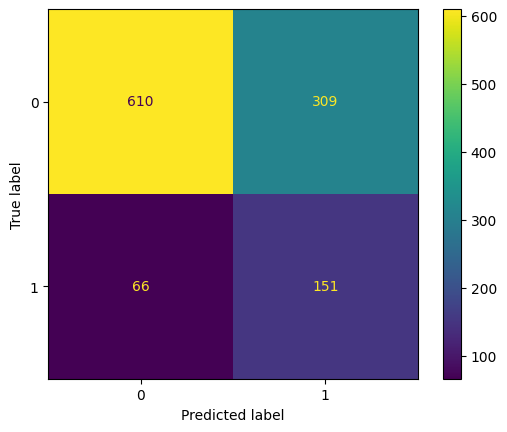

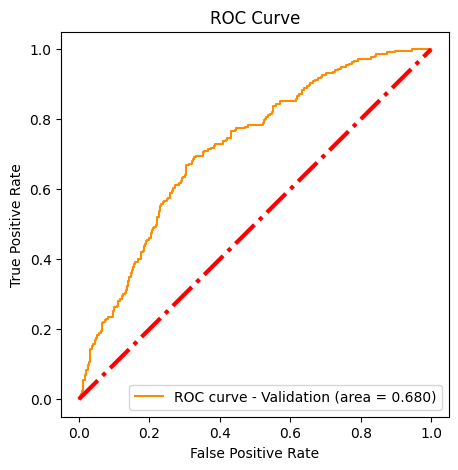

In [134]:
test_predict = pd.DataFrame(log_regress_pred_test)

print('Scoring Metrics for {} (Validation):'.format(model_log_regress))
print('Balanced Accuracy Score = {:.5f}'.format(metrics.balanced_accuracy_score(y['test'], test_predict)))
print('Accuracy Score = {:.5f}'.format(metrics.accuracy_score(y['test'], test_predict)))
print('Precision Score = {:.5f}'.format(metrics.precision_score(y['test'], test_predict)))
print('Recall Score = {:.5f}'.format(metrics.recall_score(y['test'], test_predict, labels=['0','1'])))
print('F1 Score = {:.5f}'.format(metrics.f1_score(y['test'], test_predict, labels=['0','1'])))
print('ROC AUC Score = {:.5f}'.format(metrics.roc_auc_score(y['test'], test_predict, labels=['0','1'])))

print('Confusion Matrix:')
print(metrics.confusion_matrix(y['test'], test_predict))

print("Classification_report")
print(metrics.classification_report(y['test'], test_predict, target_names=['0','1']))
metrics.ConfusionMatrixDisplay(metrics.confusion_matrix(y['test'], test_predict)).plot()

# ROC Curve
fpr, tpr, _ = metrics.roc_curve(y['test'], log_regress_proba_test)

roc_auc = metrics.roc_auc_score(y['test'], test_predict, labels=['0','1'])

# Precision x Recall Curve
precision, recall, thresholds = metrics.precision_recall_curve(y['test'], log_regress_proba_test)

print('ROC Curve:')
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
plt.plot(fpr, tpr, color='darkorange', label='ROC curve - Validation (area = %0.3f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=3, linestyle='-.')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")

plt.show()